# Basics of Qiskit Coding
***

### Intializing the Qiskit Program

In [1]:
from qiskit import QuantumRegister , ClassicalRegister, QuantumCircuit , Aer , execute, transpile
from qiskit_aer import StatevectorSimulator, QasmSimulator
from qiskit.visualization import visualize_transition, plot_histogram, circuit_drawer, plot_bloch_multivector, plot_state_qsphere
from qiskit.quantum_info import Statevector
import Our_Qiskit_Functions as oq
import numpy as np
import math as m
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

### Defining Simulators

In [2]:
S_simulator = StatevectorSimulator()
M_simulator = QasmSimulator()

### Creating a Single Qubit Quantum Circuit

In [3]:
qc = QuantumCircuit(1)
qc.x(0)

### Visualizating a Transition

In [4]:
visualize_transition(circuit = qc, trace = True) 

### Creating a Two Qubit Quantum Circuit

In [5]:
qc = QuantumCircuit(2)
qc.x(1)
qc.cx(0,1)

### Drawing the Quantum Circuit (Version-1)

In [6]:
qc.draw()

q_0: ───────■──
     ┌───┐┌─┴─┐
q_1: ┤ X ├┤ X ├
     └───┘└───┘

### Drawing the Quantum Circuit (Version-2)

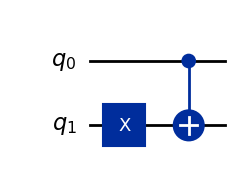

In [7]:
qc.draw('mpl', style = 'iqp')

### Observing the Bloch Spheres

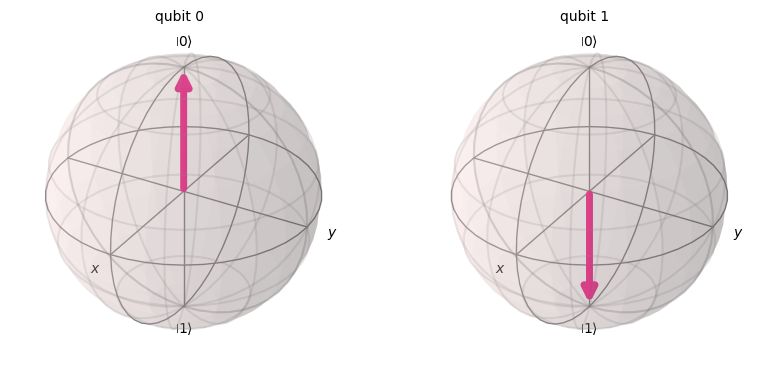

In [8]:
job = execute(qc, S_simulator)

# Get the result and the statevector
result = job.result()
statevector = result.get_statevector()

# Plot the statevector on a Bloch sphere
plot_bloch_multivector(statevector)

### Observing the Statevectors

In [9]:
job = execute(qc, S_simulator)
result = job.result()
result.get_statevector()

Statevector([0.+0.j, 0.+0.j, 1.+0.j, 0.+0.j],
            dims=(2, 2))


### Observing the Wavefunction

In [10]:
oq.Wavefunction(qc)

1.0 |10> 


### Creating a Random State

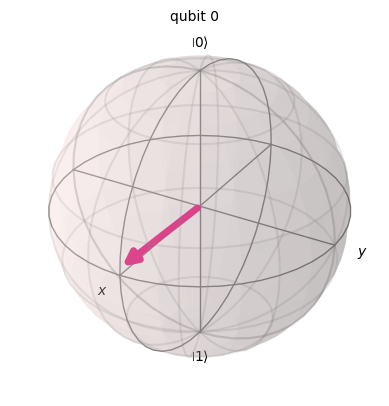

In [51]:
alpha = np.random.rand()
beta = np.sqrt(1-alpha**2)

psi = Statevector([alpha, beta])

plot_bloch_multivector(psi)

### Creating an Entangled State

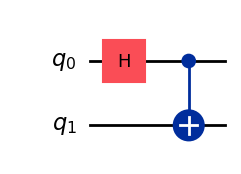

In [12]:
qc = QuantumCircuit(2)
qc.h(0)
qc.cx(0,1)
qc.draw('mpl', style = 'iqp')

In [13]:
oq.Wavefunction(qc)

0.70711 |00> 0.70711 |11> 


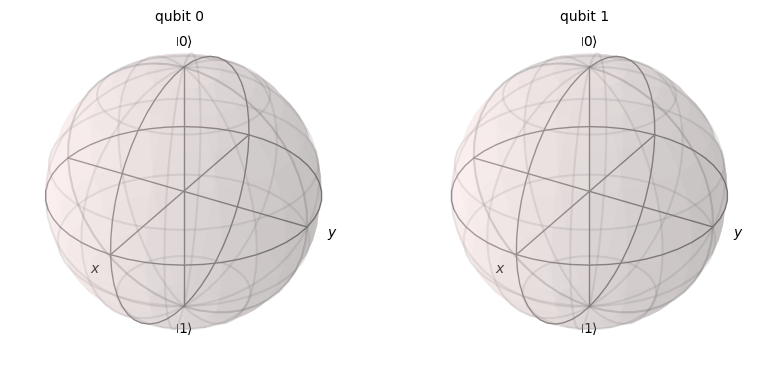

In [14]:
job = execute(qc, S_simulator)

# Get the result and the statevector
result = job.result()
statevector = result.get_statevector()

# Plot the statevector on a Bloch sphere
plot_bloch_multivector(statevector)

You can see, we are not able to observe the state of the qubits as the information is hidden due to entanglement. But once we make a measurement on any of the qubits, this entangled state collapses to classical state and we can observe their states.

### Making a Measurement

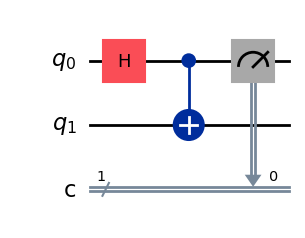

In [54]:
qc = QuantumCircuit(2,1)
qc.h(0)
qc.cx(0,1)
qc.measure(0,0)
qc.draw('mpl', style = 'iqp')

### Observing the Statevectors after Measurement

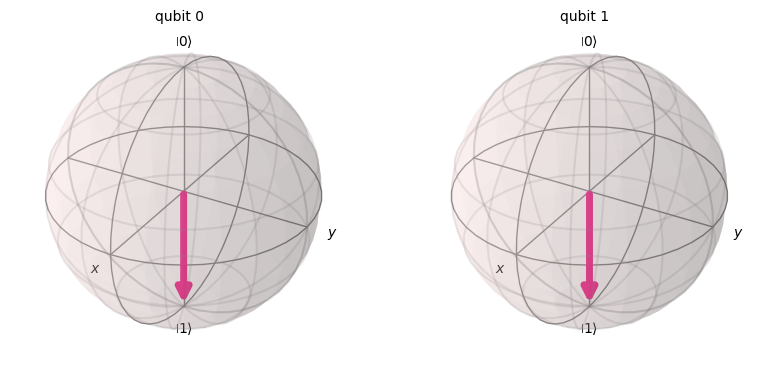

In [55]:
job = execute(qc, S_simulator)

# Get the result and the statevector
result = job.result()
statevector = result.get_statevector()

# Plot the statevector on a Bloch sphere
plot_bloch_multivector(statevector)

They can be anything based on their measurement outcomes.

In [17]:
oq.Wavefunction(qc)

1.0 |11> 


### Analysing the Measurement Outcomes using Histograms

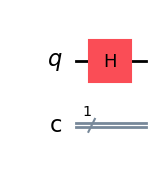

In [56]:
qc = QuantumCircuit(1,1)
qc.h(0)
qc.draw('mpl', style = 'iqp')

In [57]:
oq.Wavefunction(qc)

0.70711 |0> 0.70711 |1> 


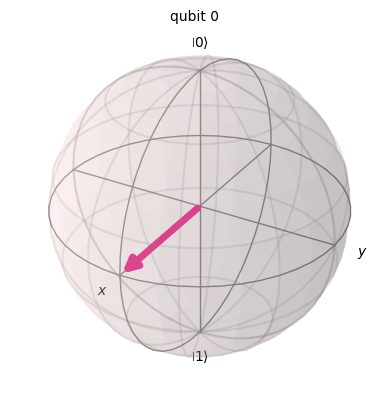

In [58]:
job = execute(qc, S_simulator)

# Get the result and the statevector
result = job.result()
statevector = result.get_statevector()

# Plot the statevector on a Bloch sphere
plot_bloch_multivector(statevector)

In [71]:
qc.measure(0,0)
job = execute(qc, M_simulator, shots=100000)
results = job.result()
counts = results.get_counts(qc)

print(counts)

{'1': 49672, '0': 50328}


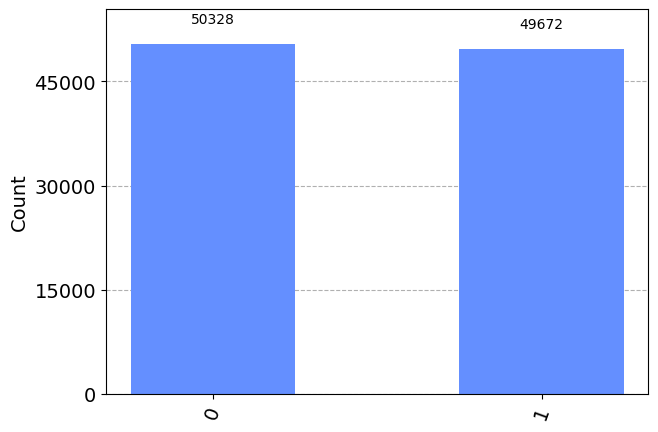

In [72]:
plot_histogram(counts)

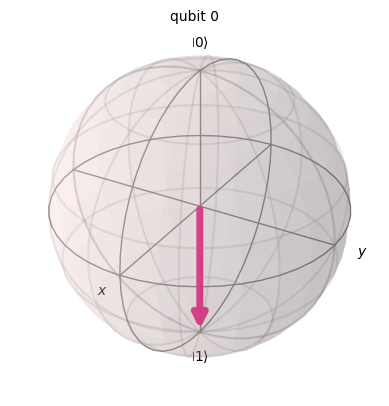

In [73]:
job = execute(qc, S_simulator)

# Get the result and the statevector
result = job.result()
statevector = result.get_statevector()

# Plot the statevector on a Bloch sphere
plot_bloch_multivector(statevector)

### Use of a Barrier

Barriers are used to create isolated blocks within a Quantum Circuit.

In [24]:
qc = QuantumCircuit(2,2)
qc.h(0)
qc.measure(0,0)
qc.barrier()
qc.cx(0,1)
oq.Measurement(qc,shots = 1000)

512|00> 488|01> 


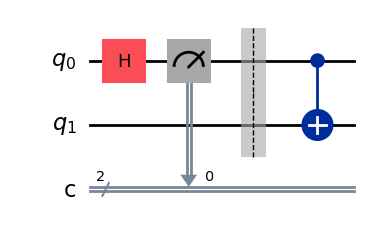

In [25]:
qc.draw('mpl', style = 'iqp')

239|01> 246|11> 251|00> 264|10> 


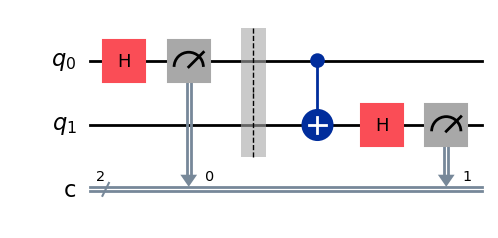

In [26]:
qc.h(1)
qc.measure(1,1)
oq.Measurement(qc,shots=1000)
qc.draw('mpl', style = 'iqp')

### Simulating A Coin Flip Game using a Quantum Circuit

In [74]:
def Coin_flip_game(flips):
    q = QuantumRegister(1,"q")
    c = ClassicalRegister(1,"c")
    qc = QuantumCircuit(q,c)
    qc.h(q)
    qc.measure(q,c)
    
    count = execute(qc, M_simulator, shots = flips).result().get_counts(qc)
    
    Heads = count['0']
    Tails = count['1']
    return (f"Heads:  {Heads}   Tails:  {Tails}")

In [77]:
print(Coin_flip_game(1000))

Heads:  497   Tails:  503


### Using the Qasm Simulator

In [80]:
q = QuantumRegister(2,"q")
c = ClassicalRegister(2,"c")
qc = QuantumCircuit(q,c)
qc.h(q)
qc.measure(q,c)
# qc.draw('mpl', style = 'iqp')
print(qc.qasm())

OPENQASM 2.0;
include "qelib1.inc";
qreg q[2];
creg c[2];
h q[0];
h q[1];
measure q[0] -> c[0];
measure q[1] -> c[1];



### Adding Registers Across Circuits

In [30]:
q1 = QuantumRegister(1,"q1")
c1 = ClassicalRegister(1,"c1")
qc1 = QuantumCircuit(q1,c1)

q2 = QuantumRegister(1,"q2")
c2 = ClassicalRegister(1,"c2")
qc2 = QuantumCircuit(q2,c2)

qc1.add_register(c2)
qc2.add_register(q1)
qc1.h(q1)
qc2.h(q2)

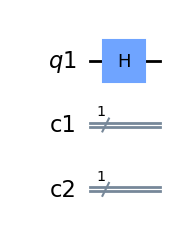

In [31]:
qc1.draw('mpl', style = 'clifford')

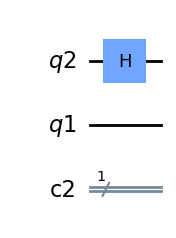

In [32]:
qc2.draw('mpl', style = 'clifford')

### Combining Two Quantum Circuits

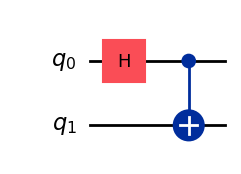

In [33]:
# Create the first Quantum Circuit
qc1 = QuantumCircuit(2)
qc1.h(0)
qc1.cx(0, 1)
qc1.draw('mpl', style = 'iqp')

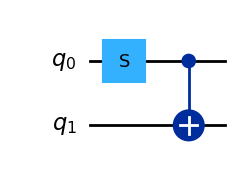

In [34]:
# Create the second Quantum Circuit
qc2 = QuantumCircuit(2)
qc2.s(0)
qc2.cx(0, 1)
qc2.draw('mpl', style = 'iqp')

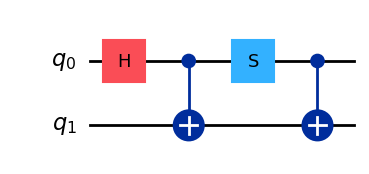

In [81]:
# Combine the circuits
qc = qc1.compose(qc2)

# Draw the combined circuit
qc.draw('mpl', style = 'iqp')

### Plotting the State Sphere for Multi-Qubit System

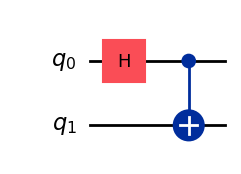

In [36]:
qc = QuantumCircuit(2)
qc.h(0)
qc.cx(0,1)
qc.draw('mpl', style = 'iqp')

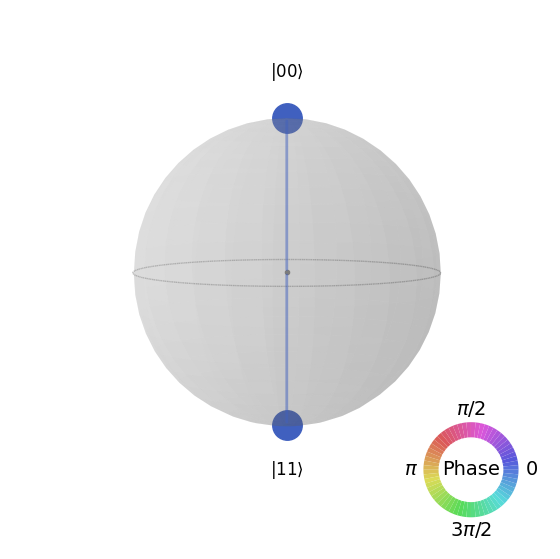

In [37]:
display(plot_state_qsphere(qc))

In [38]:
oq.Wavefunction(qc)

0.70711 |00> 0.70711 |11> 


### Another Example

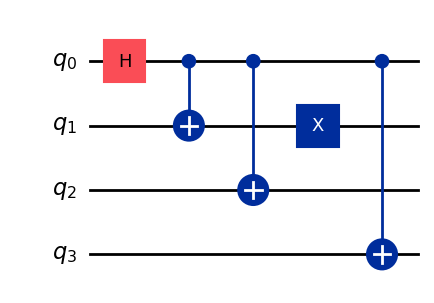

In [39]:
q = QuantumRegister(4,'q')                      
qc = QuantumCircuit(q)                          # qc = QuantumCircuit(4)
qc.h(q[0])                                      # qc.h(0)
qc.cx(q[0],q[1])                                # qc.cx(0,1)
qc.cx(q[0],q[2])                                # qc.cx(0,2)
qc.cx(q[0],q[3])                                # qc.cx(0,3)
qc.x(q[1])                                      # qc.x(1)

qc.draw('mpl', style = 'iqp')

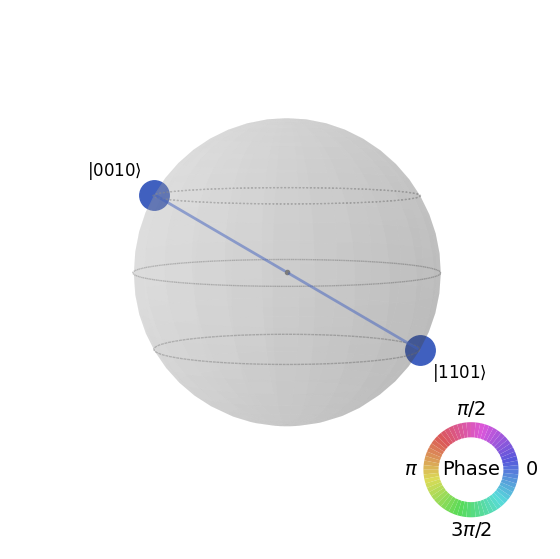

In [40]:
display(plot_state_qsphere(qc))

In [41]:
oq.Wavefunction(qc)

0.70711 |0010> 0.70711 |1101> 


### Another Example

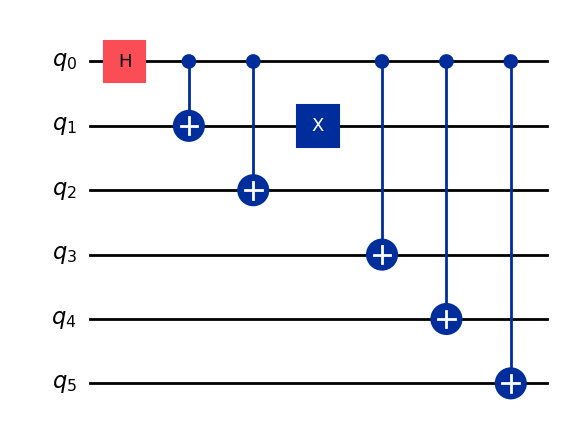

In [84]:
q = QuantumRegister(6,'q')
qc = QuantumCircuit(q)
qc.h(q[0])
qc.cx(q[0],q[1])
qc.cx(q[0],q[2])
qc.cx(q[0],q[3])
qc.cx(q[0],q[4])
qc.cx(q[0],q[5])
qc.x(q[1])

qc.draw('mpl', style = 'iqp')

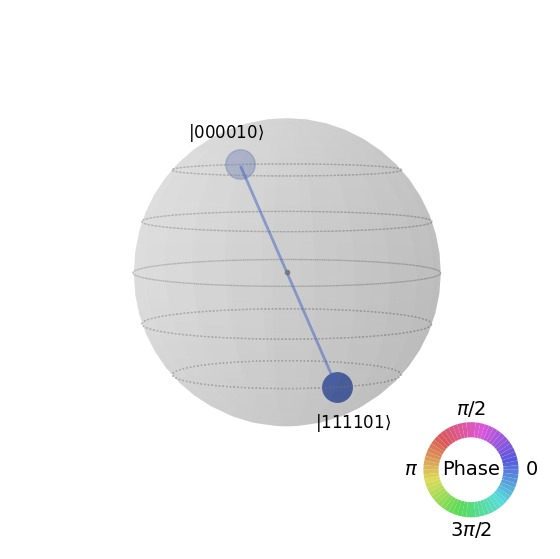

In [43]:
display(plot_state_qsphere(qc))

In [44]:
oq.Wavefunction(qc)

0.70711 |000010> 0.70711 |111101> 


In [45]:
oq.Wavefunction(qc, column=True)

0.70711 |000010> 
0.70711 |111101> 



In [46]:
oq.Wavefunction(qc, precision=10, column=True)

0.7071067812 |000010> 
0.7071067812 |111101> 



In [47]:
oq.Wavefunction(qc, systems=[1,1,1,1,1,1], column=True)

0.70711 |0>|0>|0>|0>|1>|0> 
0.70711 |1>|1>|1>|1>|0>|1> 



In [85]:
oq.Wavefunction(qc,systems=[2,4])

0.70711 |0000>|10> 0.70711 |1111>|01> 
